---

---

<div style="text-align: center;">
    <img src="ensae.png" alt="ENSAE Logo" style="width: 150px;"/>
</div>

<div style="text-align: center; font-size: 14px;">
    École nationale de la Statistique et de l'Analyse économique Pierre NDIAYE <br>
    ENSAE - Dakar
</div>

<div style="border-top: 2px solid black; margin: 20px 0;"></div>

<div style="text-align: center; font-size: 20px; font-weight: bold;">
    Projet de Machine Learning
</div>

<div style="border-top: 2px solid black; margin: 20px 0;"></div>

<div style="text-align: center;">
    <img src="seattle_image.png" alt="Seattle Consulting Logo" style="width: 300px;"/>
</div>

<div style="text-align: center; font-size: 24px; font-weight: bold; margin-top: 20px;">
    SEA Building CO2 Benchmarking : Prédiction de l’émission du CO2 <br>
    Partie Pré-traitement
</div>

<div style="display: flex; justify-content: space-between; margin-top: 40px;">
    <div style="text-align: left; width: 45%;">
        <strong>Présenté par :</strong><br>
        Koffi Samson AWOUTO<br>
        Harouna GOUMBANE<br>
        Inoussa ZAONGO<br>
        Zoumana ZERBO
    </div>
    <div style="text-align: right; width: 45%;">
        <strong>Sous l'encadrement de :</strong><br>
        Mously DIAW
    </div>
</div>

<div style="text-align: center; margin-top: 40px;">
    Décembre 2024
</div>


Ce document a été élaboré suite au projet de Machine Learning qui nous a été donné dans le cadre du cours d'Initiation au Machine Learning. Notre travail porte sur <span style="color:blue;">Prédiction de l’émission du CO₂ par les bâtiments dans la ville de Seattle</span>

### Introduction

La ville de Seattle, dans le cadre de son programme d'analyse comparative de l'énergie des bâtiments, s'est fixée l'objectif ambitieux de devenir neutre en carbone d'ici 2050. Pour atteindre cet objectif, elle se concentre particulièrement sur les émissions des bâtiments non résidentiels. Ainsi, les propriétaires de bâtiments non résidentiels et multifamiliaux d'une superficie égale ou supérieure à 20 000 pieds carrés sont tenus de soumettre un rapport annuel à la ville. L'analyse comparative annuelle, la production de rapports  constituent des éléments essentiels pour permettre des prévisions efficaces.


Notre travail consistera, dès lors, à prédire les émissions de CO2  de bâtiments pour lesquels elles n’ont pas encore été mesurées en nous servant des données de 2021 et de 2022. Pour ce faire, le plan suivant a été adopté. Ce premier Notebook est dédié au Pré-traitement de la base. Pour voir la modélisation (cliquer ici)

# Sommaire

1. [Processing](#processing)
    - [Description et Concaténation des deux bases (2021 & 2022)](#description-concatenation)
    - [NaN Détection par variable](#nan-detection)
        - [Suppression des variables répétitives et celles qui ne seront pas utilisées dans la suite](#suppression-variables-repetitives)
    - [Description des variables numériques](#description-variables-numeriques)
        - [Détection anomalies des données](#detection-anomalies)
    - [Imputation des valeurs numériques par la méthode KNNImputer](#imputation-knnimputer)
    - [Les variables catégorielles](#variables-categoriques)
    - [Imputation des valeurs manquantes des variables catégorielles](#imputation-categoriques)
    - [Analyse descriptive](#analyse-descriptive)
        - [Les variables numériques](#variables-numeriques)
            - [distribution des ages des  batiments](#batiments-ages)
            - [Répartition des batiments par  Nombre d'Étages](#batiment-étages)
            - [analyse de la variables cible](#variables-cible)
            - [Corrélation des variables](#correlation-variables)
            - [Suppression des variables trop corrélées](#suppression-variables-correlees)
        - [Les variables catégorielles](#variables-catégorielles)
            - [repartition des types de batiments](#types-batiments)
            - [repartition des Type principaux d'utilisation](#types-principaux)
            - [Répartition des Bâtiments par Quartier](#batiments-quartier)
            - [Suppression de quelques variables catégorielles](#suppression-variables-categoriques)
            - [Encodage des variables catégorielles](#encodage-categoriques)
    - [Exportation de la base traitée](#exportation-base)


# Processing <a id="processing"></a>


In [416]:
## Packages load
import pandas as pd
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import seaborn as sns
#import fancyimpute
#from fancyimpute import KNN
from sklearn.preprocessing import OrdinalEncoder, OneHotEncoder
from sklearn.impute import KNNImputer
from scipy.stats import *

In [417]:
import warnings

# Ignorer les FutureWarning et les SettingWithCopyWarning
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=pd.errors.SettingWithCopyWarning)


In [418]:
#importation de la base de données
#import os
#os.getcwd()
data_2021= pd.read_csv("2021_Building_Energy_Benchmarking.csv", sep=",")
data_2022= pd.read_csv("2022_Building_Energy_Benchmarking.csv", sep=",")

In [419]:
## Voir les dimensions des deux bases
print('2021 :',data_2021.shape, '2022 :',data_2022.shape)


2021 : (3663, 42) 2022 : (3653, 42)


nous avons 42 variables dans chacune des bases , 3663 lignes dans la base de 2021 et 3653 lignes dans la base de 2022

In [421]:
## Nous utiliserons la fonction suivante pour comparer les columns des deux bases
def columns_comparison(data1,data2):
    Data1Columns = list(data1.columns) ## Have data1 columns
    Data2Columns = list(data2.columns) ## Have data2 columns
    Data1ColumnsDiff=[] #columns in Data1 and not in Data2
    Data2ColumnsDiff=[] #columns in Data2 and not in Data1
    SimilarColumns=[]
    for i in Data2Columns:
        if i in Data1Columns:
            SimilarColumns.append(i) ## Similar columns appending
        else:
            Data2ColumnsDiff.append(i) ## Differents columns appending
    for i in Data1Columns:
        if i not in Data2Columns:
            Data1ColumnsDiff.append(i)
    print('2021 :',Data1ColumnsDiff, '2022 :',Data2ColumnsDiff)

In [422]:
columns_comparison(data_2021,data_2022)

2021 : [] 2022 : []


### Description et Concaténation des deux bases (2021 & 2022) <a id="description-et-concatenation"></a>


In [424]:
MergedData = pd.concat([data_2021,data_2022])

In [425]:
MergedData.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7316 entries, 0 to 3652
Data columns (total 42 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   OSEBuildingID                    7316 non-null   int64  
 1   DataYear                         7316 non-null   int64  
 2   BuildingName                     7316 non-null   object 
 3   BuildingType                     7316 non-null   object 
 4   TaxParcelIdentificationNumber    7316 non-null   object 
 5   Address                          7316 non-null   object 
 6   City                             7316 non-null   object 
 7   State                            7316 non-null   object 
 8   ZipCode                          7316 non-null   int64  
 9   Latitude                         7316 non-null   float64
 10  Longitude                        7316 non-null   float64
 11  Neighborhood                     7313 non-null   object 
 12  CouncilDistrictCode      

In [426]:
MergedData.isnull().sum().sort_values(ascending=False)

ThirdLargestPropertyUseType        5859
SteamUse(kBtu)                     3517
SecondLargestPropertyUseType       3378
ThirdLargestPropertyUseTypeGFA     2897
SecondLargestPropertyUseTypeGFA    1697
NaturalGas(kBtu)                   1669
NaturalGas(therms)                 1669
ENERGYSTARScore                    1174
SourceEUIWN(kBtu/sf)                519
SiteEUIWN(kBtu/sf)                  519
SiteEnergyUseWN(kBtu)               518
SiteEUI(kBtu/sf)                    458
SourceEUI(kBtu/sf)                  458
SiteEnergyUse(kBtu)                 457
EPAPropertyType                     332
LargestPropertyUseType              233
GHGEmissionsIntensity               209
Electricity(kBtu)                   208
Electricity(kWh)                    208
TotalGHGEmissions                   206
LargestPropertyUseTypeGFA           173
Neighborhood                          3
CouncilDistrictCode                   1
PropertyGFABuilding(s)                0
City                                  0


### NaN Détection par variable <a id="nan-detection"></a>

<Axes: title={'center': 'Proportion de NaN de chaque variable (%)'}, ylabel='None'>

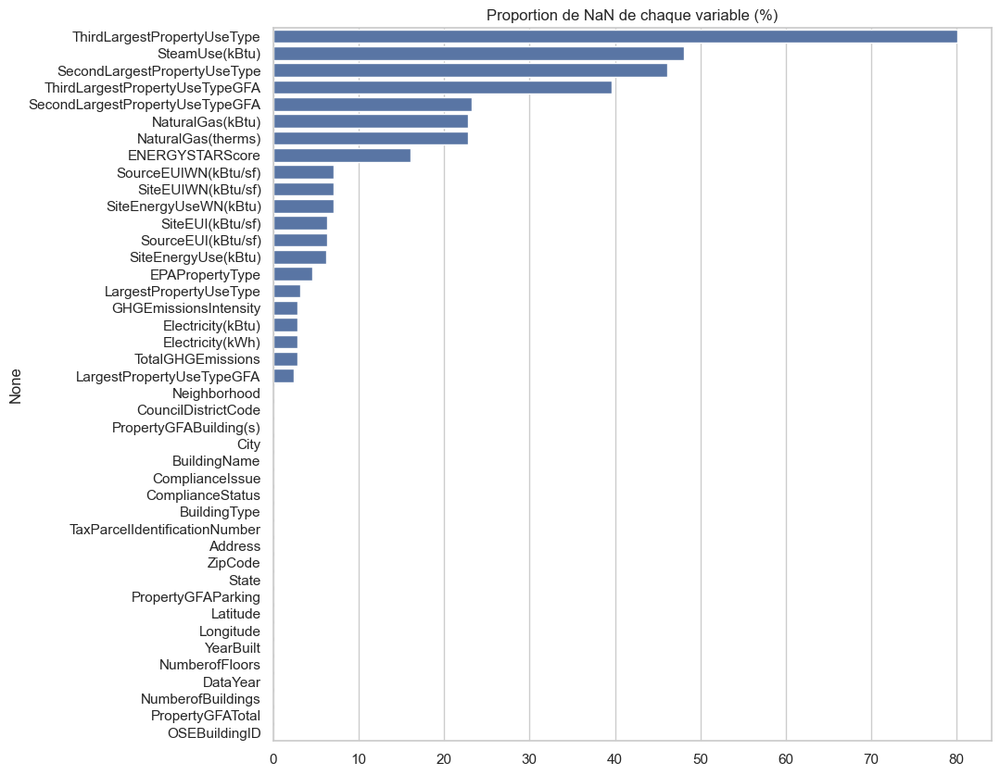

In [428]:
# Check the proportion of NaN value for each column 
plt.figure(figsize=(10,10))
plt.title('Proportion de NaN de chaque variable (%)')
NaNValues=MergedData.isnull().sum().sort_values(ascending=False)
sns.barplot(x=NaNValues.values/MergedData.shape[0]*100, y=NaNValues.index)



Dans la suite, les variables dont le taux de NaN est élevé à 30% seront supprimées puisque une imputation aura des effets (répercussion) sur notre modèle. Il s'agit des variables :

'ThirdLargestPropertyUseType' ;
'ThirdLargestPropertyUseTypeGFA' ;
'SecondlargestpropertyUseType' ;
'SteamUse(KBtu)' ;

In [430]:
## Création de la fonction qui permet de supprimer toutes les variables qui ont des NaN values à plus de 30%
def DropNaNSup30(Data):
    x=Data.isnull().sum().sort_values(ascending=False)*100/Data.shape[0]
    x=x[x>30]
    Data.drop(Data.iloc[:,Data.columns.isin(x[x>30].index)==True].columns,axis=1,inplace=True)
    return Data

In [431]:
MergedData=DropNaNSup30(MergedData)


In [432]:
MergedData.shape


(7316, 38)

In [433]:
MergedData.columns

Index(['OSEBuildingID', 'DataYear', 'BuildingName', 'BuildingType',
       'TaxParcelIdentificationNumber', 'Address', 'City', 'State', 'ZipCode',
       'Latitude', 'Longitude', 'Neighborhood', 'CouncilDistrictCode',
       'YearBuilt', 'NumberofFloors', 'NumberofBuildings', 'PropertyGFATotal',
       'PropertyGFABuilding(s)', 'PropertyGFAParking', 'ENERGYSTARScore',
       'SiteEUIWN(kBtu/sf)', 'SiteEUI(kBtu/sf)', 'SiteEnergyUse(kBtu)',
       'SiteEnergyUseWN(kBtu)', 'SourceEUIWN(kBtu/sf)', 'SourceEUI(kBtu/sf)',
       'EPAPropertyType', 'LargestPropertyUseType',
       'LargestPropertyUseTypeGFA', 'SecondLargestPropertyUseTypeGFA',
       'Electricity(kWh)', 'NaturalGas(therms)', 'ComplianceStatus',
       'ComplianceIssue', 'Electricity(kBtu)', 'NaturalGas(kBtu)',
       'TotalGHGEmissions', 'GHGEmissionsIntensity'],
      dtype='object')

Un autre constat est que certaines variables sont répétées avec des unités différentes.
Il s'agit notamment de:

'Electricity(kWh)' et 'Electricity(kBtu)' ;
'NaturalGas(therms)' et 'NaturalGas(kBtu)'.

On va supprimer l'une des variables et garder l'autre sachant que :

1th = 100 kBtu
1 kBTU = 0.293014534 kWh

Certaines variables de l'énergie telles que:
'SiteEUIWN(kBtu/sf)' et 'SiteEUI(kBtu/sf)' : exprime l'intensité réelle de la consommation d'énergie du bâtiment et celle du bâtiment normalisée par les conditions météorologiques, i.e, celle qu'il aurait consommée dans des conditions météorologiques moyennes sur 30 ans.
'SiteEnergyUse(kBtu)' et 'SiteEnergyUseWN(kBtu)' : exprime l'utilisation réelle d'énergie du bâtiment et celle du bâtiment normalisée par les conditions météorologiques, i.e, celle qu'il aurait utilisée dans des conditions météorologiques moyennes sur 30 ans.
'SourceEUIWN(kBtu/sf)' et 'SourceEUI(kBtu/sf)' : exprime l'énergie source réelle du bâtiment et celle du bâtiment normalisée par les conditions météorologiques, i.e, celle qu'il aurait utilisée dans des conditions météorologiques moyennes sur 30 ans.
Nous en profiterons également pour supprimer les variables non utile pour la suite. Il s'agit des variables suivantes:
'BuildingName' ;
'Address' ;
'City' ;
'State' ;
'ZipCode' ;
'CouncilDistrictCode' ;

#### Suppression des variables répétitives et celles qui ne seront pas utilisées dans la suite <a id="suppression-variables-repetitives"></a>


In [436]:
BuildingName=MergedData['BuildingName'] ## On en aura besoin dans la suite
LocationInfos=MergedData[['Address','City','State','ZipCode','CouncilDistrictCode']]
MergedData.drop(
    [
    'Electricity(kWh)','NaturalGas(therms)', ## les variables répététives
    'BuildingName',
    'Address',
    'City',
    'State',
    'ZipCode',
    'CouncilDistrictCode',
    'TaxParcelIdentificationNumber'
        ],
    axis=1, inplace=True)

In [437]:
## Voir les modalités de chaque variable catégorielle
def categorial_variables_modalities(Data):
    categorial_variables=Data.select_dtypes(exclude=[np.number])
    for i in categorial_variables.columns:
        print(categorial_variables[i].value_counts())
        print("_"*75)
    ##return categorial_variables

In [438]:
categorial_variables_modalities(MergedData)

BuildingType
NonResidential          2909
Multifamily LR (1-4)    2158
Multifamily MR (5-9)    1518
Multifamily HR (10+)     269
SPS-District K-12        206
Nonresidential COS       133
Campus                    97
Nonresidential WA         26
Name: count, dtype: int64
___________________________________________________________________________
Neighborhood
DOWNTOWN                                                 1227
EAST                                                     1002
MAGNOLIA / QUEEN ANNE                                     922
GREATER DUWAMISH                                          731
NORTHEAST                                                 647
LAKE UNION                                                574
NORTHWEST                                                 452
SOUTHWEST                                                 361
NORTH                                                     296
BALLARD                                                   293
CENTRAL             

 ### Description des variables numériques <a id="description-variables-numeriques"></a>


In [440]:
## Voir les propriétés des variables numériques pour repérer les éventuelles incorrections
MergedData.select_dtypes(exclude=[np.object_]).describe()

,OSEBuildingID,DataYear,Latitude,Longitude,YearBuilt,NumberofFloors,NumberofBuildings,PropertyGFATotal,PropertyGFABuilding(s),PropertyGFAParking,...,SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SourceEUIWN(kBtu/sf),SourceEUI(kBtu/sf),LargestPropertyUseTypeGFA,SecondLargestPropertyUseTypeGFA,Electricity(kBtu),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity
count,7316.000000,7316.000000,7316.000000,7316.000000,7316.000000,7316.000000,7316.000000,7.316000e+03,7.316000e+03,7316.000000,...,6.859000e+03,6.798000e+03,6797.000000,6858.000000,7.143000e+03,5619.000000,7.108000e+03,5.647000e+03,7110.000000,7107.000000
mean,23992.863040,2021.499317,47.611834,-122.301411,1973.519683,5.102652,1.150355,1.070618e+05,9.063686e+04,16424.970612,...,5.346213e+06,5.239148e+06,109.796675,111.498819,8.666682e+04,23643.314469,3.558590e+06,1.982123e+06,121.606526,1.174766
std,14391.383916,0.500034,0.788760,2.022728,34.754407,5.758953,1.763789,2.091185e+05,1.809072e+05,47852.602005,...,1.643194e+07,1.607081e+07,109.000453,109.121426,2.245513e+05,53717.876592,1.429322e+07,9.214355e+06,594.372973,2.132209
min,1.000000,2021.000000,0.000000,-122.414250,1896.000000,0.000000,0.000000,2.000000e+04,1.111100e+04,-3.000000,...,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000
25%,20296.750000,2021.000000,47.601400,-122.350662,1953.000000,3.000000,1.000000,2.974000e+04,2.768300e+04,0.000000,...,9.354060e+05,9.057505e+05,66.699997,67.900002,2.614800e+04,0.000000,6.484988e+05,1.425000e+03,4.700000,0.100000
50%,23637.000000,2021.000000,47.619325,-122.332410,1980.000000,4.000000,1.000000,4.754400e+04,4.418800e+04,0.000000,...,1.911410e+06,1.868982e+06,84.099998,85.599998,4.231200e+04,6352.000000,1.201056e+06,6.170600e+05,27.550000,0.500000
75%,26995.500000,2022.000000,47.657197,-122.318685,2002.000000,6.000000,1.000000,1.022350e+05,8.936400e+04,10008.000000,...,4.475770e+06,4.391638e+06,115.500000,117.800003,8.490100e+04,21547.000000,2.840715e+06,1.795310e+06,92.800000,1.300000
max,50893.000000,2022.000000,47.733870,0.000000,2022.000000,76.000000,111.000000,9.320156e+06,9.320156e+06,686750.000000,...,5.795551e+08,5.305824e+08,2678.899902,2678.899902,1.521647e+07,752163.000000,9.191679e+08,4.327243e+08,23545.100000,47.400000


On constate qu'il y a des bâtiments pour lesquelles l'Espace total en pieds carrés de tous les types de stationnement (PropertyGFAParking) est négatif. Pour d'autres bâtiments, la consommation d'énergie, l'énergie source, l'électricité, les émissions de CO2... sont renseignés à 0.0

Enumérons ces erreurs


#### Détection d'anomalies des données <a id="detection-anomalies"></a>


In [443]:
## PropertyGFAParking négatif
MergedData[MergedData.PropertyGFAParking<0]

,OSEBuildingID,DataYear,BuildingType,Latitude,Longitude,Neighborhood,YearBuilt,NumberofFloors,NumberofBuildings,PropertyGFATotal,...,EPAPropertyType,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseTypeGFA,ComplianceStatus,ComplianceIssue,Electricity(kBtu),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity
3238,49970,2021,NonResidential,47.65718,-122.31632,NORTHEAST,2011,0,1,176225,...,Residence Hall/Dormitory,Residence Hall/Dormitory,176225.0,24000.0,Compliant,No Issue,2931435.0,1475460.0,90.5,0.5


Il s'agit donc du bâtiment d'identifiant 49970.

In [445]:
## Bâtiments pour lesquels l'énergie source est nulle
MergedData[MergedData['SourceEUI(kBtu/sf)']<=0]

,OSEBuildingID,DataYear,BuildingType,Latitude,Longitude,Neighborhood,YearBuilt,NumberofFloors,NumberofBuildings,PropertyGFATotal,...,EPAPropertyType,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseTypeGFA,ComplianceStatus,ComplianceIssue,Electricity(kBtu),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity
46,61,2021,NonResidential,47.60973,-122.34038,DOWNTOWN,1900,4,1,50510,...,Hotel,Hotel,46409.0,0.0,Not Compliant,Missing 2021 EUI or Electricity Data,0.0,0.0,0.0,0.00
69,110,2021,Nonresidential COS,47.62395,-122.35143,MAGNOLIA / QUEEN ANNE,1962,2,1,52000,...,Social/Meeting Hall,Social/Meeting Hall,54981.0,0.0,Compliant,No Issue,1668195.0,0.0,0.0,0.00
70,112,2021,Nonresidential COS,47.62395,-122.35143,MAGNOLIA / QUEEN ANNE,1928,2,1,262048,...,Performing Arts,Performing Arts,296000.0,0.0,Compliant,No Issue,9391714.0,114800.0,0.0,0.00
86,136,2021,NonResidential,47.73141,-122.34580,NORTHWEST,2001,4,1,51390,...,Multifamily Housing,Multifamily Housing,51390.0,0.0,Not Compliant,Missing 2021 EUI or Electricity Data,1166524.0,0.0,0.0,0.00
89,139,2021,NonResidential,47.72529,-122.34115,NORTHWEST,2002,3,1,69138,...,Multifamily Housing,Multifamily Housing,69138.0,0.0,Not Compliant,Missing 2021 EUI or Electricity Data,1528017.0,0.0,0.0,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
797,19920,2022,Multifamily LR (1-4),47.61724,-122.34594,DOWNTOWN,1925,3,1,44736,...,Multifamily LR (1-4),Multifamily Housing,40636.0,4504.0,Compliant,No Issue,648502.0,2219860.0,2.5,0.06
955,20419,2022,NonResidential,47.56504,-122.38455,SOUTHWEST,1965,3,1,49744,...,K-12 School,K-12 School,49744.0,0.0,Not Compliant,"Missing EUI, Incomplete Natural Gas Data",301098.0,0.0,1.2,0.02
1920,23969,2022,NonResidential,47.57930,-122.32226,GREATER DUWAMISH,1960,1,1,24109,...,NaN,NaN,0.0,0.0,Not Compliant,Portfolio Manager Not Connected to the City of...,0.0,0.0,0.0,0.00
2192,24964,2022,NonResidential,47.57011,-122.34024,GREATER DUWAMISH,1942,1,3,27654,...,NaN,NaN,0.0,0.0,Not Compliant,Portfolio Manager Not Connected to the City of...,0.0,0.0,0.0,0.00


Revenons aux valeurs manquantes
Il s'agira de trouver une méthode d'imputation de ces valeurs manquantes.

Dans le cadre de notre travail, il s'agira de faire une imputation par catégorie de variables :

Pour les variables numériques, nous procéderons à une imputation par la méthode de KNN imputer
;
Par rapport aux variables catégorielles, nous utiliserons le mode pour faire l'imputation des valeurs manquantes des variables à moins de 5% de pourcentage. Et pour le reste, nous utiliserons le KNN imputer too.

In [447]:
## Imputation des variables numériques
num=[col for col in MergedData.columns if MergedData[col].dtypes!='O']
categorial=[col for col in MergedData.columns if MergedData[col].dtypes=='O']

In [448]:
MergedData[num]

,OSEBuildingID,DataYear,Latitude,Longitude,YearBuilt,NumberofFloors,NumberofBuildings,PropertyGFATotal,PropertyGFABuilding(s),PropertyGFAParking,...,SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SourceEUIWN(kBtu/sf),SourceEUI(kBtu/sf),LargestPropertyUseTypeGFA,SecondLargestPropertyUseTypeGFA,Electricity(kBtu),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity
0,1,2021,47.61220,-122.33799,1927,12,1,88434,88434,0,...,6510477.0,6522024.0,144.399994,144.199997,88434.0,0.0,3224187.0,1487620.0,241.6,2.70
1,2,2021,47.61307,-122.33361,1996,11,1,103566,88502,15064,...,4617104.0,4617104.0,99.099998,99.099998,88502.0,15064.0,2243315.0,2373790.0,135.4,1.50
2,3,2021,47.61367,-122.33822,1969,41,3,956110,759392,196718,...,43953212.0,43953212.0,105.300003,105.300003,945349.0,117783.0,29594739.0,3775000.0,1201.4,1.60
3,5,2021,47.61412,-122.33664,1926,10,1,61320,61320,0,...,4873753.0,4873753.0,136.000000,136.000000,61320.0,0.0,1738403.0,1967580.0,208.6,3.40
4,8,2021,47.61375,-122.34047,1980,18,1,175580,113580,62000,...,11358936.0,11409090.0,161.500000,161.100006,123445.0,68009.0,4550233.0,6808700.0,380.4,3.30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3648,50877,2022,47.52429,-122.31234,1981,2,1,51837,51837,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3649,50879,2022,47.61689,-122.33410,2019,13,1,575826,448997,126829,...,67778656.0,64468892.0,261.000000,272.700012,413858.0,150000.0,23823898.0,43954750.0,2425.8,5.40
3650,50881,2022,47.60844,-122.33470,2020,10,1,122000,122000,0,...,635362.0,620477.0,14.700000,15.000000,101264.0,17038.0,635362.0,0.0,2.4,0.02
3651,50886,2022,47.65715,-122.34204,2022,5,1,824678,813338,11340,...,1221582.0,NaN,NaN,33.900002,81338.0,11340.0,843455.0,NaN,3.2,NaN


In [449]:
target_var = ['TotalGHGEmissions']
for i in target_var:
    print(MergedData[i].agg(["min", "max"]))
    print("_" * 25)


min        0.0
max    23545.1
Name: TotalGHGEmissions, dtype: float64
_________________________


 ### Imputation des valeurs numériques par la méthode KNNImputer <a id="imputation-knnimputer"></a>


In [451]:
## Définition de la fonction knn
knn=KNNImputer(n_neighbors=5 ##,add_indicator=True
              )
               ## add_indicator pour dire donner une indication que la ligne 
                ## contienait bien une valeur manquante

In [452]:
knn.fit(MergedData[num])



KNNImputer()

In [453]:
pd.DataFrame(knn.transform(MergedData[num]))

,0,1,2,3,4,5,6,7,8,9,...,13,14,15,16,17,18,19,20,21,22
0,1.0,2021.0,47.61220,-122.33799,1927.0,12.0,1.0,88434.0,88434.0,0.0,...,6510477.0,6522024.0,144.399994,144.199997,88434.0,0.0,3224187.0,1487620.0,241.60,2.700
1,2.0,2021.0,47.61307,-122.33361,1996.0,11.0,1.0,103566.0,88502.0,15064.0,...,4617104.0,4617104.0,99.099998,99.099998,88502.0,15064.0,2243315.0,2373790.0,135.40,1.500
2,3.0,2021.0,47.61367,-122.33822,1969.0,41.0,3.0,956110.0,759392.0,196718.0,...,43953212.0,43953212.0,105.300003,105.300003,945349.0,117783.0,29594739.0,3775000.0,1201.40,1.600
3,5.0,2021.0,47.61412,-122.33664,1926.0,10.0,1.0,61320.0,61320.0,0.0,...,4873753.0,4873753.0,136.000000,136.000000,61320.0,0.0,1738403.0,1967580.0,208.60,3.400
4,8.0,2021.0,47.61375,-122.34047,1980.0,18.0,1.0,175580.0,113580.0,62000.0,...,11358936.0,11409090.0,161.500000,161.100006,123445.0,68009.0,4550233.0,6808700.0,380.40,3.300
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7311,50877.0,2022.0,47.52429,-122.31234,1981.0,2.0,1.0,51837.0,51837.0,0.0,...,1413411.8,1371316.4,47.740001,49.199999,50192.8,1132.6,850900.4,672974.0,33.20,0.652
7312,50879.0,2022.0,47.61689,-122.33410,2019.0,13.0,1.0,575826.0,448997.0,126829.0,...,67778656.0,64468892.0,261.000000,272.700012,413858.0,150000.0,23823898.0,43954750.0,2425.80,5.400
7313,50881.0,2022.0,47.60844,-122.33470,2020.0,10.0,1.0,122000.0,122000.0,0.0,...,635362.0,620477.0,14.700000,15.000000,101264.0,17038.0,635362.0,0.0,2.40,0.020
7314,50886.0,2022.0,47.65715,-122.34204,2022.0,5.0,1.0,824678.0,813338.0,11340.0,...,1221582.0,1229095.0,27.060000,33.900002,81338.0,11340.0,843455.0,213186.0,3.20,0.124


In [454]:
NumImputed=pd.DataFrame(knn.transform(MergedData[num]))
NumImputed.columns=num
NumImputed.index=MergedData.index
NumImputed.isnull().sum()

OSEBuildingID                      0
DataYear                           0
Latitude                           0
Longitude                          0
YearBuilt                          0
NumberofFloors                     0
NumberofBuildings                  0
PropertyGFATotal                   0
PropertyGFABuilding(s)             0
PropertyGFAParking                 0
ENERGYSTARScore                    0
SiteEUIWN(kBtu/sf)                 0
SiteEUI(kBtu/sf)                   0
SiteEnergyUse(kBtu)                0
SiteEnergyUseWN(kBtu)              0
SourceEUIWN(kBtu/sf)               0
SourceEUI(kBtu/sf)                 0
LargestPropertyUseTypeGFA          0
SecondLargestPropertyUseTypeGFA    0
Electricity(kBtu)                  0
NaturalGas(kBtu)                   0
TotalGHGEmissions                  0
GHGEmissionsIntensity              0
dtype: int64

In [455]:
target_var=['TotalGHGEmissions']
for i in target_var:
    print(NumImputed[i].agg(["min","max"]))
    print("_"*25)

min        0.0
max    23545.1
Name: TotalGHGEmissions, dtype: float64
_________________________


In [456]:
target_var=['TotalGHGEmissions']
for i in target_var:
    print(MergedData[i].agg(["min","max"]))
    print("_"*25)

min        0.0
max    23545.1
Name: TotalGHGEmissions, dtype: float64
_________________________


 ### Les variables catégorielles <a id="variables-categoriques"></a>

In [458]:
MergedData[categorial]

,BuildingType,Neighborhood,EPAPropertyType,LargestPropertyUseType,ComplianceStatus,ComplianceIssue
0,NonResidential,DOWNTOWN,Hotel,Hotel,Compliant,No Issue
1,NonResidential,DOWNTOWN,Hotel,Hotel,Compliant,No Issue
2,NonResidential,DOWNTOWN,Hotel,Hotel,Compliant,No Issue
3,NonResidential,DOWNTOWN,Hotel,Hotel,Compliant,No Issue
4,NonResidential,DOWNTOWN,Hotel,Hotel,Compliant,No Issue
...,...,...,...,...,...,...
3648,NonResidential,GREATER DUWAMISH,NaN,NaN,Not Compliant,Portfolio Manager Not Connected to the City of...
3649,NonResidential,DOWNTOWN,Laboratory,Laboratory,Compliant,No Issue
3650,NonResidential,DOWNTOWN,Office,Office,Compliant,No Issue
3651,Multifamily MR (5-9),LAKE UNION,Multifamily MR (5-9),Multifamily Housing,Compliant,No Issue


 ### Imputation des valeurs manquantes des variables catégorielles <a id="imputation-categoriques"></a>


In [460]:
x=MergedData[categorial].isnull().sum().sort_values(ascending=False)*100/MergedData.shape[0]
x<5

EPAPropertyType           True
LargestPropertyUseType    True
Neighborhood              True
BuildingType              True
ComplianceStatus          True
ComplianceIssue           True
dtype: bool

toutes les variables catégorielles sont à pourcentage de NaN inférieure à 5%. C'est d'ailleurs ce qui va nous permettre d'imputer par le <span style="color:blue;">le mode</span>.

In [462]:
## Imputation colonne par colonne
def ImputationByMode(Data):
    for i in Data.columns:
        Data[i].fillna(Data[i].mode()[0],inplace=True)
    return Data

In [463]:

CategorialData = MergedData[categorial]
CategorialData = ImputationByMode(CategorialData)
CategorialData.isnull().sum()


BuildingType              0
Neighborhood              0
EPAPropertyType           0
LargestPropertyUseType    0
ComplianceStatus          0
ComplianceIssue           0
dtype: int64

L'imputation est faite pour les deux catégories de variable

### Analyse descriptive <a id="analyse-descriptive"></a>


Visualisation des bâtiments

In [467]:
import folium
from folium import plugins
data_map = folium.Map(location=MergedData[['Latitude','Longitude']].mean().tolist(), zoom_start=12)

In [468]:
marker_cluster = plugins.MarkerCluster().add_to(data_map)

# Add markers to the marker cluster for each data point
for row in range(MergedData.shape[0]):
    folium.Marker(
        location=list(NumImputed[['Latitude','Longitude']].iloc[row].values),
        popup=BuildingName.iloc[row],  # Popup text is in a column of the dataframe
    ).add_to(marker_cluster)
##st.markdown(data_map._repr_html_(), unsafe_allow_html=True)
# Display the map
data_map

#### Les variables numériques <a id="variables-numeriques"></a>


In [470]:
NumImputed.columns

Index(['OSEBuildingID', 'DataYear', 'Latitude', 'Longitude', 'YearBuilt',
       'NumberofFloors', 'NumberofBuildings', 'PropertyGFATotal',
       'PropertyGFABuilding(s)', 'PropertyGFAParking', 'ENERGYSTARScore',
       'SiteEUIWN(kBtu/sf)', 'SiteEUI(kBtu/sf)', 'SiteEnergyUse(kBtu)',
       'SiteEnergyUseWN(kBtu)', 'SourceEUIWN(kBtu/sf)', 'SourceEUI(kBtu/sf)',
       'LargestPropertyUseTypeGFA', 'SecondLargestPropertyUseTypeGFA',
       'Electricity(kBtu)', 'NaturalGas(kBtu)', 'TotalGHGEmissions',
       'GHGEmissionsIntensity'],
      dtype='object')

Nous ferons l'analyse descriptive des variables suivantes:

'ENERGYSTARScore',

'SiteEUI(kBtu/sf)' et 'SiteEUIWN(kBtu/sf)',

'SiteEnergyUse(kBtu)' et 'SiteEnergyUseWN(kBtu)',

'SourceEUI(kBtu/sf)' et 'SourceEUIWN(kBtu/sf)',


'Electricity(kBtu)',
'NaturalGas(kBtu)',
'TotalGHGEmissions',
'GHGEmissionsIntensity'

In [472]:
col=[
'ENERGYSTARScore',
'Electricity(kBtu)',
'NaturalGas(kBtu)',
'TotalGHGEmissions',
'GHGEmissionsIntensity'
]

##'SourceEUI(kBtu/sf)','SourceEUIWN(kBtu/sf)',

BoxPlot des variables numériques

In [474]:
def NumVarBoxPlot(Data):
    for columns in Data.columns:
        plt.figure(figsize = (8,1))
        sns.boxplot(x = Data[columns])
        titre = 'Répartition de : '+ columns
        plt.title(titre)
        plt.xlabel(columns)
        plt.show()
    sns.set(font_scale = 1)

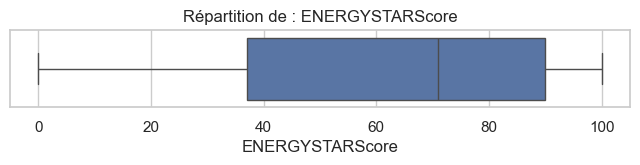

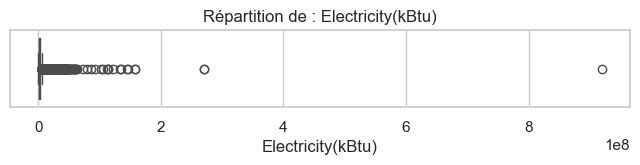

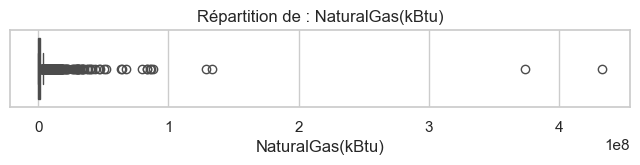

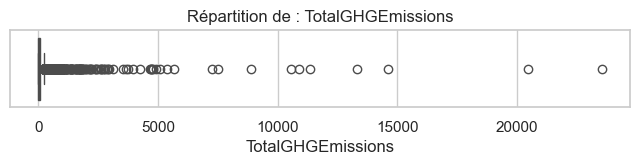

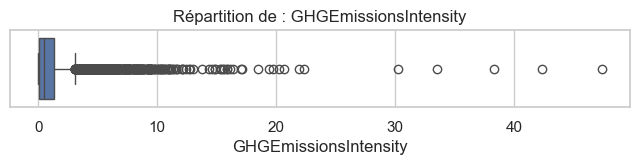

In [475]:
NumVarBoxPlot(NumImputed[col])


####

##### distribution des ages des  batiments <a id="batiments-ages"></a>

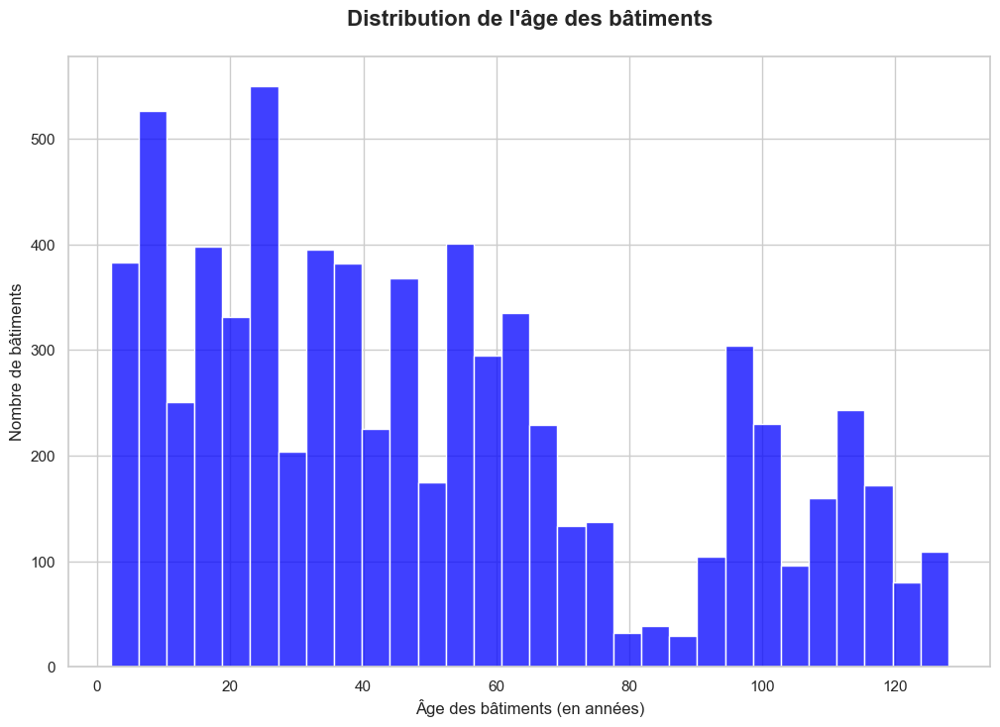

In [478]:
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime

# Définir le style de Seaborn
sns.set(style="whitegrid")

# Colonne contenant l'année de construction
year_built_column = 'YearBuilt'

# Calcul de l'âge des bâtiments
current_year = datetime.now().year
NumImputed['BuildingAge'] = current_year - NumImputed[year_built_column]

# Vérification pour supprimer les âges négatifs ou aberrants
NumImputed = NumImputed[NumImputed['BuildingAge'] >= 0]

# Définir les paramètres du titre
font_title = {'fontsize': 16, 'fontweight': 'bold'}

# Vérifiez la version de Seaborn pour utiliser la fonction appropriée
if int(sns.__version__.split('.')[0]) < 0 or (int(sns.__version__.split('.')[0]) == 0 and int(sns.__version__.split('.')[1]) < 11):
    # Utilisation de distplot pour les versions antérieures à 0.11.0
    fig = plt.figure(figsize=(12, 8))
    ax = sns.distplot(
        NumImputed['BuildingAge'].dropna(),  # Supprimer les valeurs manquantes
        bins=30,  # Diviser en 30 intervalles
        kde=False,
        color='blue'
    )
    ax.set_xlabel("Âge des bâtiments (en années)")
    ax.set_ylabel("Nombre de bâtiments")
    plt.title(f"Distribution de l'âge des bâtiments\n", fontdict=font_title)
    plt.show()
else:
    # Utilisation de histplot pour les versions de Seaborn >= 0.11.0
    fig = plt.figure(figsize=(12, 8))
    ax = sns.histplot(
        NumImputed['BuildingAge'].dropna(),
        bins=30,  # Diviser en 30 intervalles
        kde=False,
        color='blue'
    )
    ax.set_xlabel("Âge des bâtiments (en années)")
    ax.set_ylabel("Nombre de bâtiments")
    plt.title(f"Distribution de l'âge des bâtiments\n", fontdict=font_title)
    plt.show()


Le graphique montre la distribution de l'âge des bâtiments dans la base de données. On observe que la majorité des bâtiments ont moins de 50 ans, avec des pics autour des tranches d'âge 10-20 ans et 30-40 ans, ce qui indique une forte concentration de bâtiments relativement récents. Cependant, des bâtiments plus anciens, y compris certains dépassant les 100 ans, sont également présents, bien que moins nombreux. Cette répartition montre une certaine diversité en termes d'âge des bâtiments, avec une prédominance de constructions récentes, tout en mettant en évidence des bâtiments historiques ou anciens qui représentent une petite proportion de l'ensemble. L'irrégularité de la distribution pourrait refléter des influences économiques, démographiques ou historiques sur les périodes de construction.

##### Répartition des batiments par  Nombre d'Étages <a id="batiment-étages"></a>

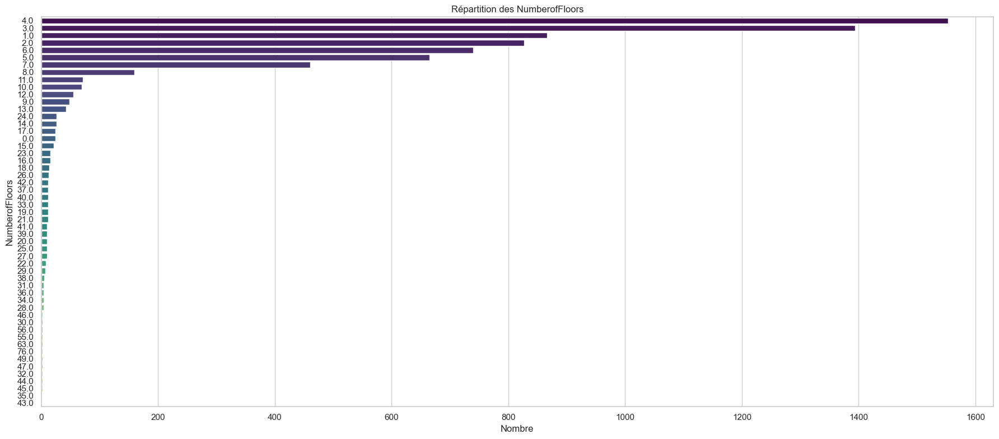

In [481]:
# Liste des colonnes qualitatives
qualitative_columns = ['NumberofFloors']

# Style Seaborn
sns.set(style="whitegrid")

# Diagrammes à barres verticales pour les autres colonnes qualitatives
for column in qualitative_columns:
    if column != 'BuildingType':  # On saute 'BuildingType' pour ne pas la représenter en histogramme
        plt.figure(figsize=(18, 8))  # Taille de la figure pour les histogrammes
        sns.countplot(y=NumImputed[column], order=NumImputed[column].value_counts().index, palette='viridis')
        plt.title(f"Répartition des {column}")
        plt.xlabel('Nombre')
        plt.ylabel(column)
        plt.tight_layout()  # Ajustement de la mise en page pour éviter les superpositions
        plt.show()

la majorité des bâtiments dans la base de données ont un petit nombre d'étages, et très peu ont plus de 10 étages.

##### analyse de la variables cible  <a id="variables-cible"></a>

Nous rappelons que notre variable cible est TotalGHGEmissions. Nous allons donc réaliser quelques analyses exploratoires sur ces features

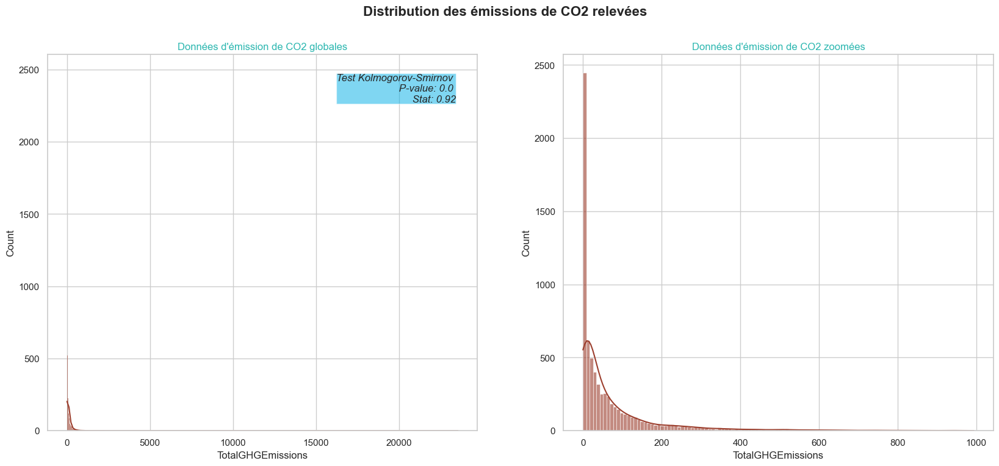

In [485]:
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats

# Définir le titre du graphique
font_title = {'fontsize': 16, 'fontweight': 'bold'}

# Créer les sous-graphiques
fig, axes = plt.subplots(nrows=1, ncols=2, sharex=False, sharey=False, figsize=(20, 8))

# Paramètres de placement pour le texte
left, width = 0, 1
bottom, height = 0, 1
right = left + width
top = bottom + height

# Histogramme pour la distribution des émissions de CO2 globales
sns.histplot(data=NumImputed, x="TotalGHGEmissions", kde=True, ax=axes[0], color="#9C3E2D", alpha=0.6)
axes[0].set_title("Données d'émission de CO2 globales", color='#2cb7b0')

# Test de Kolmogorov-Smirnov
kstest = stats.kstest(NumImputed['TotalGHGEmissions'].dropna(), 'norm')  # Suppression des valeurs manquantes
axes[0].text(0.95, 0.95, f'Test Kolmogorov-Smirnov \n P-value: {kstest.pvalue:.2} \n Stat: {kstest.statistic:.2}',
             horizontalalignment='right',
             verticalalignment='top',
             style='italic', transform=axes[0].transAxes, fontsize=12,
             bbox={'facecolor': '#00afe6', 'alpha': 0.5, 'pad': 0})

# Histogramme zoomé pour les émissions de CO2 avec valeurs < 1000
sns.histplot(data=NumImputed[NumImputed['TotalGHGEmissions'] < 1000], x="TotalGHGEmissions", kde=True, ax=axes[1],
             color="#9C3E2D", alpha=0.6)
axes[1].set_title("Données d'émission de CO2 zoomées", color='#2cb7b0')

# Titre général pour les graphiques
plt.suptitle("Distribution des émissions de CO2 relevées", fontsize=16, fontweight='bold')

# Affichage du graphique
plt.show()


Ce graphique montre la distribution générale des émissions de CO2 dans l'ensemble des données. La courbe de densité de probabilité (KDE) superposée à l'histogramme indique que la distribution des émissions de CO2 est fortement concentrée vers des valeurs faibles, avec une longue queue à droite, suggérant la présence de quelques observations extrêmes (des valeurs de CO2 élevées).

##### Corrélation des variables <a id="correlation-variables"></a>


ci-dessous les corrélations des variables avec la variables cible  <span style="color:blue;">TotalGHGEmissions</span>

In [489]:
#target = NumImputed[["TotalGHGEmissions"]]
#target1 = target["TotalGHGEmissions"]


In [490]:
#NumImputed.drop(target, axis = 1, inplace = True)


In [491]:
#NumImputed["target1"] = target["TotalGHGEmissions"]  
correlation1 = NumImputed.corr()["TotalGHGEmissions"].sort_values()
correlation1

ENERGYSTARScore                   -0.064452
OSEBuildingID                     -0.055617
BuildingAge                       -0.018739
Latitude                          -0.000961
Longitude                         -0.000403
DataYear                           0.002530
YearBuilt                          0.018739
NumberofBuildings                  0.122983
NumberofFloors                     0.123000
PropertyGFAParking                 0.194238
SourceEUIWN(kBtu/sf)               0.251518
SourceEUI(kBtu/sf)                 0.255973
LargestPropertyUseTypeGFA          0.271267
SiteEUIWN(kBtu/sf)                 0.319560
SiteEUI(kBtu/sf)                   0.326907
SecondLargestPropertyUseTypeGFA    0.397093
Electricity(kBtu)                  0.399690
GHGEmissionsIntensity              0.402212
PropertyGFATotal                   0.415650
PropertyGFABuilding(s)             0.429089
NaturalGas(kBtu)                   0.767423
SiteEnergyUseWN(kBtu)              0.883976
SiteEnergyUse(kBtu)             

In [492]:
for i in correlation1.index:
    if abs(correlation1[i])<0.01:
        print(i)

Latitude
Longitude
DataYear


In [493]:
### Suppression des variables très faiblement corrélées entre elles
Localisation=NumImputed[['Latitude','Longitude']]
YearBuilt=NumImputed['YearBuilt']
NumImputed.drop(['Latitude','Longitude'],inplace=True, axis=1)

In [494]:
target_var=['TotalGHGEmissions']
for i in target_var:
    print(NumImputed[i].agg([min,max]))
    print("_"*25)

min        0.0
max    23545.1
Name: TotalGHGEmissions, dtype: float64
_________________________


ci dessous les correlations entre les variables

<Axes: >

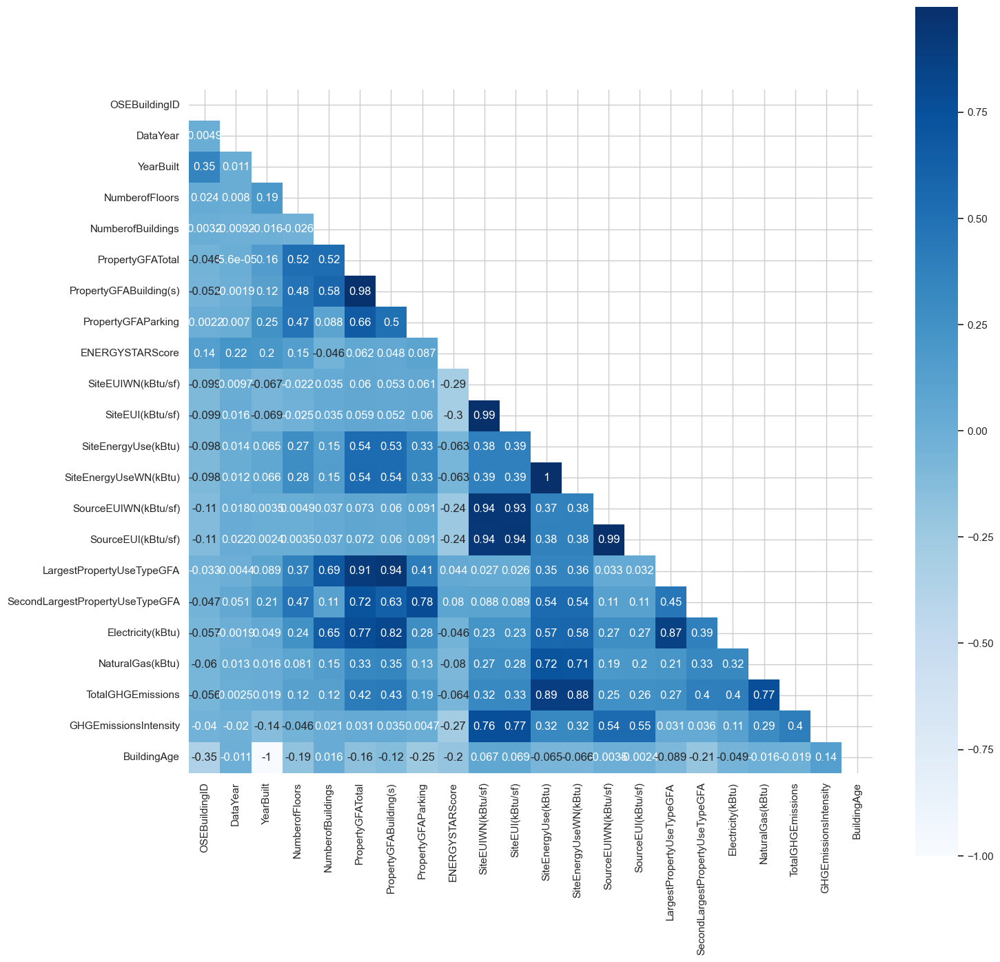

In [496]:
plt.figure(figsize = (16,16))
mask = np.zeros_like(NumImputed.corr())
mask[np.triu_indices_from(mask)] = True
sns.heatmap(NumImputed.corr(), cmap='Blues', annot=True, square=True, mask=mask, 
            cbar=True, vmin=None, vmax=None)

In [497]:
correlation = NumImputed.corr()
correlation.columns.value_counts().sum().sum()

22

In [498]:
list(correlation.columns)

['OSEBuildingID',
 'DataYear',
 'YearBuilt',
 'NumberofFloors',
 'NumberofBuildings',
 'PropertyGFATotal',
 'PropertyGFABuilding(s)',
 'PropertyGFAParking',
 'ENERGYSTARScore',
 'SiteEUIWN(kBtu/sf)',
 'SiteEUI(kBtu/sf)',
 'SiteEnergyUse(kBtu)',
 'SiteEnergyUseWN(kBtu)',
 'SourceEUIWN(kBtu/sf)',
 'SourceEUI(kBtu/sf)',
 'LargestPropertyUseTypeGFA',
 'SecondLargestPropertyUseTypeGFA',
 'Electricity(kBtu)',
 'NaturalGas(kBtu)',
 'TotalGHGEmissions',
 'GHGEmissionsIntensity',
 'BuildingAge']

 ##### Suppression des variables trop corrélées <a id="suppression-variables-correlees"></a>


In [500]:

PropertyGFABuilding=NumImputed['PropertyGFABuilding(s)']
SiteEUIWN=NumImputed['SiteEUIWN(kBtu/sf)']
LargestPropertyUseTypeGFA=NumImputed['LargestPropertyUseTypeGFA']
NumImputed.drop([
    'SourceEUI(kBtu/sf)',
    'SourceEUIWN(kBtu/sf)'
    ]
,inplace=True,axis=1)

In [501]:
NumImputed.shape

(7316, 20)

In [502]:
target_var=['TotalGHGEmissions']
for i in target_var:
    print(NumImputed[i].agg([min,max]))
    print("_"*25)

min        0.0
max    23545.1
Name: TotalGHGEmissions, dtype: float64
_________________________


#### les variables catégorielles <a id="variables-numeriques"></a>

In [504]:
categorial_variables_modalities(CategorialData)


BuildingType
NonResidential          2909
Multifamily LR (1-4)    2158
Multifamily MR (5-9)    1518
Multifamily HR (10+)     269
SPS-District K-12        206
Nonresidential COS       133
Campus                    97
Nonresidential WA         26
Name: count, dtype: int64
___________________________________________________________________________
Neighborhood
DOWNTOWN                                                 1230
EAST                                                     1002
MAGNOLIA / QUEEN ANNE                                     922
GREATER DUWAMISH                                          731
NORTHEAST                                                 647
LAKE UNION                                                574
NORTHWEST                                                 452
SOUTHWEST                                                 361
NORTH                                                     296
BALLARD                                                   293
CENTRAL             

##### repartition des types de batiments <a id="types-batiments"></a>

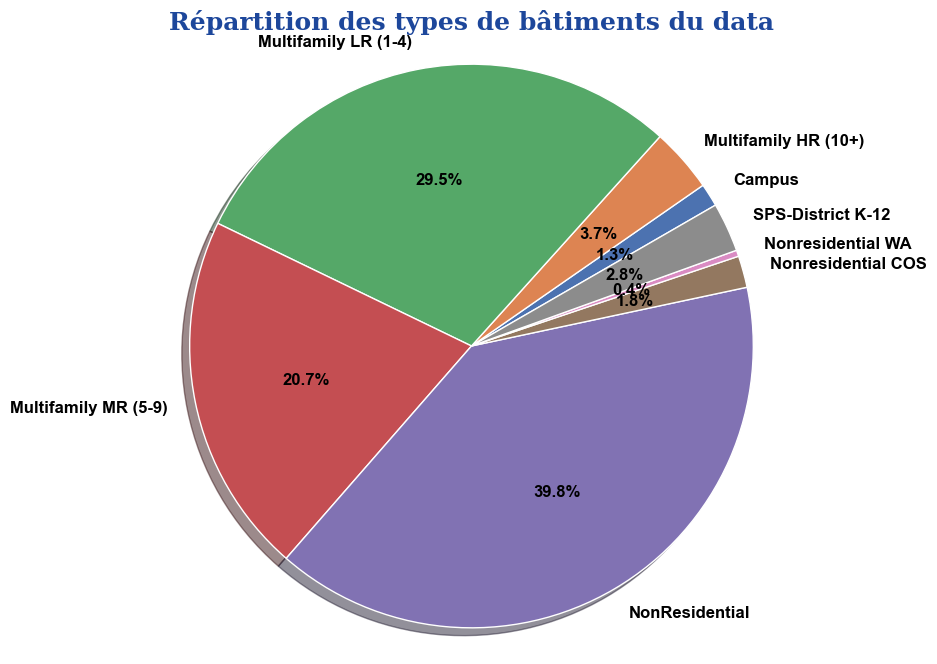

In [506]:
# Regrouper les données par 'BuildingType' et compter le nombre de lignes
building_type = CategorialData.groupby(by='BuildingType').size()

# Définir les propriétés du titre
font_title = {'family': 'serif',
              'color': '#1d479b',
              'weight': 'bold',
              'size': 18,
             }

# Créer le graphique circulaire
fig, ax = plt.subplots(figsize=(8, 8))
ax.pie(building_type.values, labels=building_type.index, 
       autopct='%1.1f%%', shadow=True, startangle=30,
       textprops=dict(color="black", size=12, weight="bold"))
ax.axis('equal')  # Assure un aspect circulaire parfait
ax.set_title("Répartition des types de bâtiments du data", fontdict=font_title)
plt.show()

La majorité des bâtiments dans votre jeu de données sont non résidentiels (39.8%), suivis par les logements multifamiliaux de faible hauteur (29.5%). Les autres catégories, telles que les logements multifamiliaux de hauteur moyenne et les campus, représentent des proportions plus petites. Les bâtiments non résidentiels de l'État de Washington sont les moins représentés (0.4%).

##### repartition des Type principaux d'utilisation de la propriété <a id="types-principaux"></a>

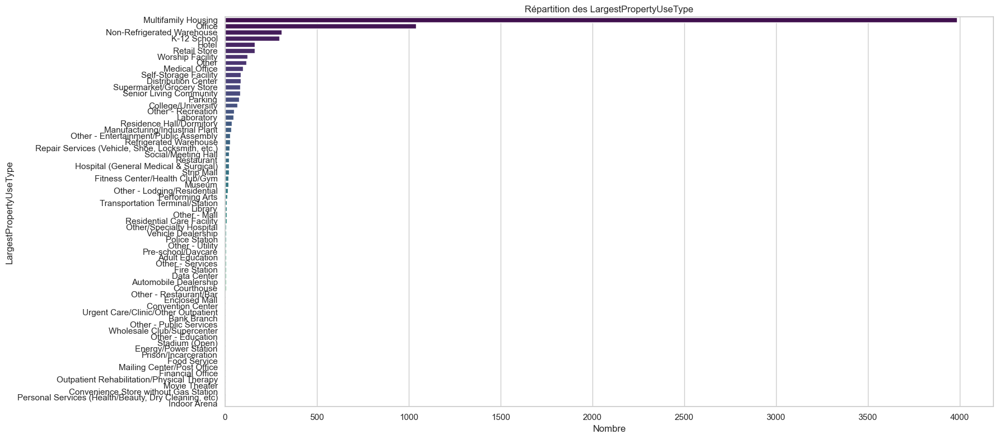

In [509]:
import seaborn as sns
import matplotlib.pyplot as plt

# Colonnes qualitatives dans votre base de données
qualitative_columns = ['LargestPropertyUseType']

# Style Seaborn
sns.set(style="whitegrid")

# Diagrammes à barres verticales pour les colonnes qualitatives
for column in qualitative_columns:
    if column != 'BuildingType':  # On saute 'BuildingType' si elle est présente
        plt.figure(figsize=(18, 8))  # Taille de la figure pour les histogrammes
        sns.countplot(y=CategorialData[column], 
                      order=CategorialData[column].value_counts().index, 
                      palette='viridis')
        plt.title(f"Répartition des {column}")
        plt.xlabel('Nombre')
        plt.ylabel(column)
        plt.tight_layout()  # Ajustement de la mise en page pour éviter les superpositions
        plt.show()


Le graphique montre clairement que les utilisations principales des propriétés les plus courantes sont les logements multifamiliaux , les bureaux, et les entrepôts non réfrigérés. Les autres catégories, telles que les écoles K-12, les lieux de culte, et les garages de stationnement, sont également bien représentées mais dans une moindre mesure. Les catégories moins fréquentes incluent les services de réparation, les hôpitaux, et les stations de pompiers/police.

##### Répartition des Bâtiments selon le Type de propriété définit par  l'EPA <a id="types-EPA"></a>

EPA : Acronyme pour Environmental Protection Agency (Agence de Protection de l'Environnement), une organisation gouvernementale américaine qui régule les questions environnementales, comme les émissions, la gestion énergétique, et les ressources naturelles.

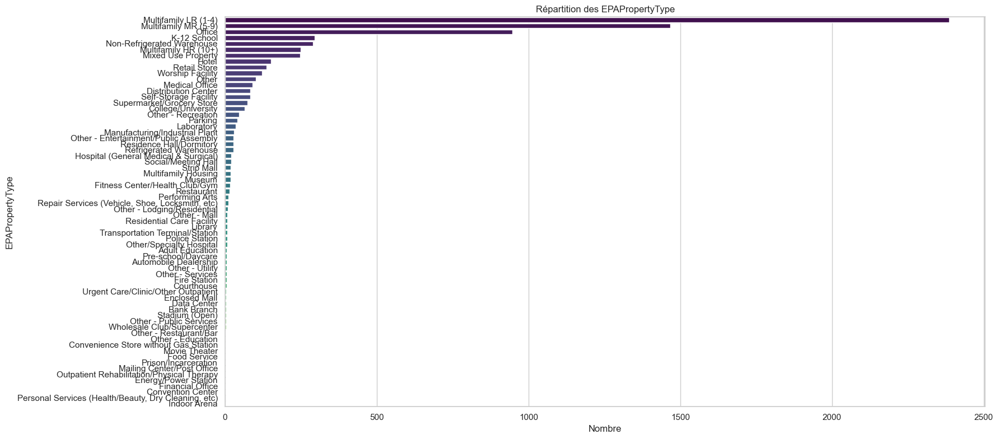

In [513]:
# Liste des colonnes qualitatives
qualitative_columns = ['EPAPropertyType']

# Style Seaborn
sns.set(style="whitegrid")

# Diagrammes à barres verticales pour les colonnes qualitatives
for column in qualitative_columns:
    plt.figure(figsize=(18, 8))  # Taille de la figure pour les histogrammes
    sns.countplot(y=CategorialData[column], 
                  order=CategorialData[column].value_counts().index, 
                  palette='viridis')
    plt.title(f"Répartition des {column}")
    plt.xlabel('Nombre')
    plt.ylabel(column)
    plt.tight_layout()  # Ajustement de la mise en page pour éviter les superpositions
    plt.show()

selon le type de propriété définit par l'Agence de Protection de l'Environnement , on obsève que les multifamily LR , MR , bureaux sont largement représenté dans la base 

##### Répartition des Bâtiments par Quartier <a id="batiments-quartier"></a>

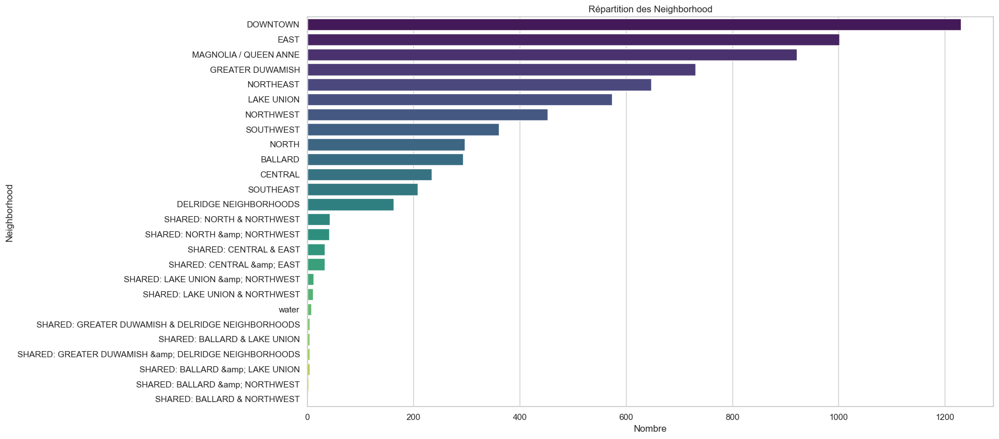

In [516]:
# Liste des colonnes qualitatives
qualitative_columns = ['Neighborhood']

# Style Seaborn
sns.set(style="whitegrid")

# Diagrammes à barres verticales pour les colonnes qualitatives
for column in qualitative_columns:
    plt.figure(figsize=(18, 8))  # Taille de la figure pour les histogrammes
    sns.countplot(y=CategorialData[column], 
                  order=CategorialData[column].value_counts().index, 
                  palette='viridis')
    plt.title(f"Répartition des {column}")
    plt.xlabel('Nombre')
    plt.ylabel(column)
    plt.tight_layout()  # Ajustement de la mise en page pour éviter les superpositions
    plt.show()

Le graphique montre clairement que les quartiers les plus représentés sont DOWNTOWN et EAST, suivis par MAGNOLIA / QUEEN ANNE et GREATER DUWAMISH. Les autres quartiers, tels que NORTHEAST, LAKE UNION, et NORTHWEST, sont également bien représentés mais dans une moindre mesure. Les quartiers partagés (comme SHARED: NORTH & NORTHWEST) représentent des proportions plus petites.

 ##### Suppression des variables catégorielles non utile <a id="suppression-variables-categoriques"></a>


In [519]:
# Supprimer les colonnes spécifiées
CategorialData.drop(['EPAPropertyType', 'ComplianceStatus', 'ComplianceIssue'], axis=1, inplace=True)

# Vérifier les colonnes restantes
print(CategorialData.columns)


Index(['BuildingType', 'Neighborhood', 'LargestPropertyUseType'], dtype='object')


 ##### Encodage des variables catégorielles <a id="encodage-categoriques"></a>

nous utilisons la methode de label encoding qui conciste à labelisé la variable qualitative suivant une hierachisation .
Ici nous avons classifier les modalités par intervalles de la variable cible , ensuite hiérachisé les modalités en 0 pour celles classées  low emissions , en 1 pour celles classées  Average emissions , et en 2 pour celles classées  high emissions

In [522]:
# Fonction pour vérifier si la valeur est supérieure à un seuil global
def x_times_more(x, val1, global_mean):
    if val1 > x * global_mean:
        return True
    else:
        return False

# Fonction pour vérifier si la valeur est inférieure à un seuil global
def x_times_less(x, val1, global_mean):
    if val1 < x * global_mean:
        return True
    else:
        return False 

# Fonction pour catégoriser les émissions élevées et faibles
def large_emission_track(variable, df, tresholdmax, tresholdmin):
    the_mean = df["TotalGHGEmissions"].mean()
    cat = df[variable].unique()
    high_cat = []
    low_cat = []
    
    for c in cat:
        x = df.loc[df[variable] == c]
        m = x["TotalGHGEmissions"].mean()
        if x_times_more(tresholdmax, m, the_mean):
            high_cat.append(c)
        elif x_times_less(tresholdmin, m, the_mean):
            low_cat.append(c)
            
    return high_cat, low_cat







In [523]:
use_high,use_low=large_emission_track('LargestPropertyUseType',MergedData,2.5,0.4)
#2.5 (seuil supérieur, tresholdmax) :

#Ce seuil indique qu'une catégorie est considérée comme haute en émissions si sa moyenne d'émissions dépasse 2,5 fois la moyenne globale des émissions.
#0.4 (seuil inférieur, tresholdmin)

print("Categories with high CO2 emissions: \n",use_high)
print("\n Categories with low CO2 emissions: \n",use_low)

Categories with high CO2 emissions: 
 ['Hotel', 'Courthouse', 'Prison/Incarceration', 'College/University', 'Data Center', 'Hospital (General Medical & Surgical)', 'Museum', 'Laboratory', 'Convention Center', 'Other/Specialty Hospital', 'Stadium (Open)', 'Indoor Arena']

 Categories with low CO2 emissions: 
 ['Self-Storage Facility', 'Worship Facility', 'Other - Lodging/Residential', 'Distribution Center', 'Refrigerated Warehouse', 'Energy/Power Station', 'Bank Branch', 'Food Service', 'Pre-school/Daycare', 'Movie Theater', 'Personal Services (Health/Beauty, Dry Cleaning, etc)', 'Convenience Store without Gas Station', 'Vehicle Dealership']


In [524]:
#Function allowing to encode the level of emission of co2 
#0 = low emissions
#1 = Average emissions
#2 = high emissions
def encode_usetype(usetype):
    if usetype in use_high:
        return 2
    elif usetype in use_low:
        return 0
    else:
        return 1
#Encoding LargestUseType
CategorialData["largestUseType_encode"]=CategorialData['LargestPropertyUseType'].apply(encode_usetype)
CategorialData=CategorialData.drop(columns=['LargestPropertyUseType'])

In [525]:
use_high,use_low=large_emission_track('BuildingType', MergedData,1.8,0.5)
print("Categories with high CO2 emissions: \n",use_high)
print("\n Categories with low CO2 emissions: \n",use_low)

Categories with high CO2 emissions: 
 ['Campus', 'Multifamily HR (10+)', 'Nonresidential WA']

 Categories with low CO2 emissions: 
 ['Multifamily LR (1-4)']


In [526]:
CategorialData["BuildingType"]=CategorialData['BuildingType'].apply(encode_usetype)
CategorialData["BuildingType"].unique



<bound method Series.unique of 0       1
1       1
2       1
3       1
4       1
       ..
3648    1
3649    1
3650    1
3651    1
3652    1
Name: BuildingType, Length: 7316, dtype: int64>

In [527]:
import statistics
def large_emission_track_med(variable, df,tresholdmax,tresholdmin):
    the_mean=statistics.median(df["TotalGHGEmissions"].values)
    cat=df[variable].unique()
    high_cat=[]
    low_cat=[]
    for c in cat:
        x=df.loc[df[variable]==c]
        m=statistics.median(x["TotalGHGEmissions"].values)
        if x_times_more(tresholdmax,m,the_mean):
            high_cat.append(c)
        elif x_times_less(tresholdmin,m,the_mean):
            low_cat.append(c)
    return high_cat, low_cat

In [528]:
use_high,use_low=large_emission_track('Neighborhood', MergedData,1.5,0.6)
print("Categories with high CO2 emissions: \n",use_high)
print("\n Categories with low CO2 emissions: \n",use_low)
def encode_downtown(area):
    if area=="DOWNTOWN":
        return 1
    else:
        return 0
CategorialData['Neighborhood']=CategorialData['Neighborhood'].apply(encode_usetype)

Categories with high CO2 emissions: 
 []

 Categories with low CO2 emissions: 
 ['SHARED: CENTRAL & EAST', 'NORTH', 'MAGNOLIA / QUEEN ANNE', 'SOUTHWEST', 'DELRIDGE NEIGHBORHOODS', 'SHARED: NORTH & NORTHWEST', 'SHARED: GREATER DUWAMISH & DELRIDGE NEIGHBORHOODS', 'SHARED: BALLARD & LAKE UNION', 'SHARED: LAKE UNION & NORTHWEST', 'SHARED: BALLARD & NORTHWEST', 'water', 'SHARED: CENTRAL &amp; EAST', 'SHARED: BALLARD &amp; NORTHWEST', 'SHARED: NORTH &amp; NORTHWEST', 'SHARED: GREATER DUWAMISH &amp; DELRIDGE NEIGHBORHOODS', 'SHARED: BALLARD &amp; LAKE UNION', 'SHARED: LAKE UNION &amp; NORTHWEST']


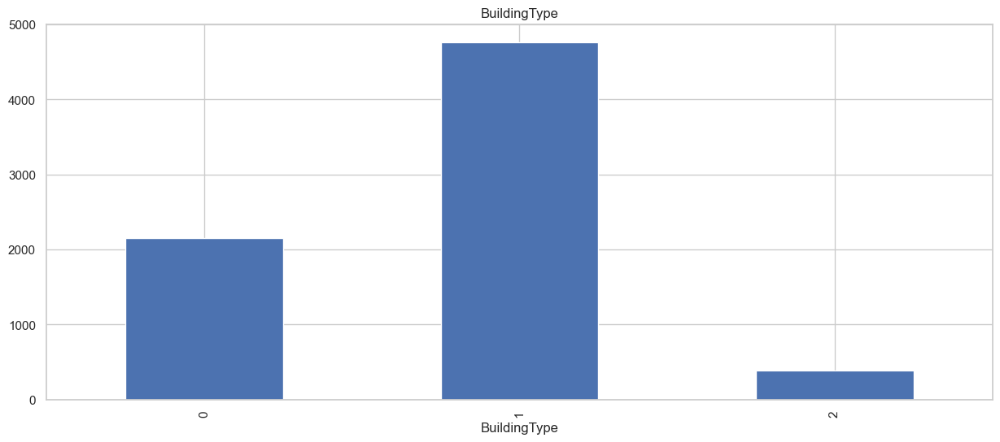

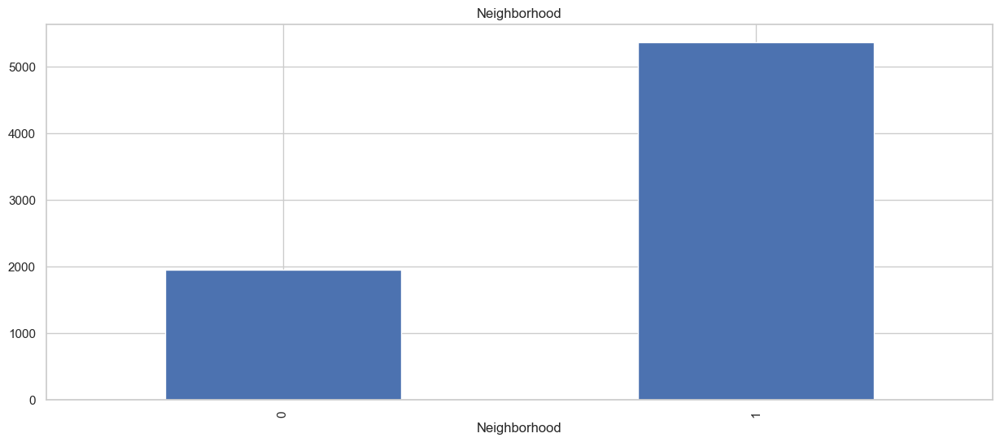

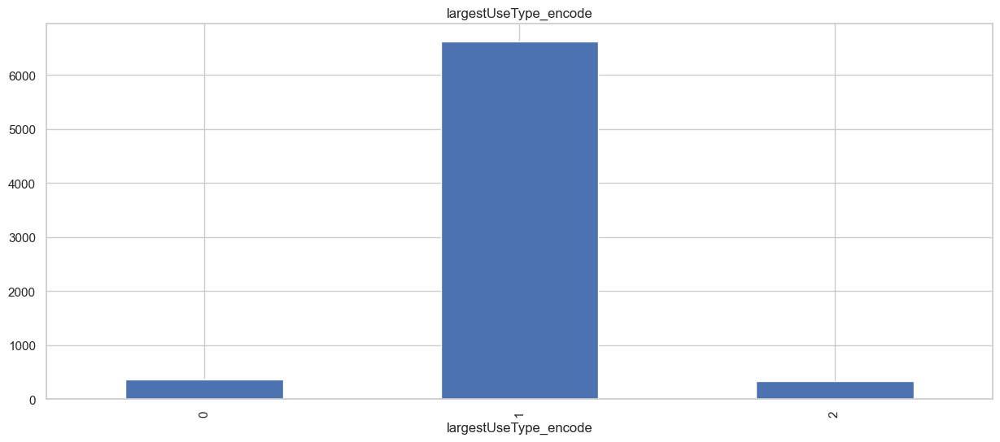

In [529]:
for column in CategorialData.columns:
    fig = plt.figure(figsize=(15,6))
    CategorialData[column].value_counts().sort_index(axis=0).plot(kind='bar')
    plt.title(column)
    plt.show()

#### concatenons les bases celle des variables numérique et celle des variables catégorielle

In [531]:
data=pd.concat([NumImputed,CategorialData],axis=1)

##### filter la variable cible pour avoir positif

In [533]:
# Filtrer les valeurs strictement positives de la variable cible
data = data[data['TotalGHGEmissions'] > 0]

# Afficher les premières lignes pour vérifier
print(data.head())


   OSEBuildingID  DataYear  YearBuilt  NumberofFloors  NumberofBuildings  \
0            1.0    2021.0     1927.0            12.0                1.0   
1            2.0    2021.0     1996.0            11.0                1.0   
2            3.0    2021.0     1969.0            41.0                3.0   
3            5.0    2021.0     1926.0            10.0                1.0   
4            8.0    2021.0     1980.0            18.0                1.0   

   PropertyGFATotal  PropertyGFABuilding(s)  PropertyGFAParking  \
0           88434.0                 88434.0                 0.0   
1          103566.0                 88502.0             15064.0   
2          956110.0                759392.0            196718.0   
3           61320.0                 61320.0                 0.0   
4          175580.0                113580.0             62000.0   

   ENERGYSTARScore  SiteEUIWN(kBtu/sf)  ...  LargestPropertyUseTypeGFA  \
0             78.0           73.800003  ...                    884

In [534]:
# Filtrer les valeurs strictement positives de la variable cible
data = data[data['NumberofBuildings'] > 0]

# Afficher les premières lignes pour vérifier
print(data.head())


   OSEBuildingID  DataYear  YearBuilt  NumberofFloors  NumberofBuildings  \
0            1.0    2021.0     1927.0            12.0                1.0   
1            2.0    2021.0     1996.0            11.0                1.0   
2            3.0    2021.0     1969.0            41.0                3.0   
3            5.0    2021.0     1926.0            10.0                1.0   
4            8.0    2021.0     1980.0            18.0                1.0   

   PropertyGFATotal  PropertyGFABuilding(s)  PropertyGFAParking  \
0           88434.0                 88434.0                 0.0   
1          103566.0                 88502.0             15064.0   
2          956110.0                759392.0            196718.0   
3           61320.0                 61320.0                 0.0   
4          175580.0                113580.0             62000.0   

   ENERGYSTARScore  SiteEUIWN(kBtu/sf)  ...  LargestPropertyUseTypeGFA  \
0             78.0           73.800003  ...                    884

data = data.drop(['PropertyGFATotal','YearBuilt'] ,axis=1 )

##### Creation de la variable BuildingAge

In [537]:
data['BuildingAge'] = data['DataYear'] - data['YearBuilt']
print(data[['BuildingAge','DataYear','YearBuilt']])

      BuildingAge  DataYear  YearBuilt
0            94.0    2021.0     1927.0
1            25.0    2021.0     1996.0
2            52.0    2021.0     1969.0
3            95.0    2021.0     1926.0
4            41.0    2021.0     1980.0
...           ...       ...        ...
3648         41.0    2022.0     1981.0
3649          3.0    2022.0     2019.0
3650          2.0    2022.0     2020.0
3651          0.0    2022.0     2022.0
3652          3.0    2022.0     2019.0

[7104 rows x 3 columns]


##### Suppression des variable qui ne vont plus nous servir

In [539]:
data = data.drop(['DataYear','YearBuilt'] ,axis=1 )

In [540]:
#'Latitude', 'Longitude','SiteEUI(kBtu/sf'),'SiteEnergyUseWN(kBtu)','SourceEUIWN(kBtu/sf)','SourceEUI(kBtu/sf)','SecondLargestPropertyUseTypeGFA','ThirdLargestPropertyUseTypeGFA'

In [541]:
#data = data.drop(['Latitude', 'Longitude','SiteEUI(kBtu/sf)','SiteEnergyUseWN(kBtu)','SourceEUIWN(kBtu/sf)','SourceEUI(kBtu/sf)','SecondLargestPropertyUseTypeGFA','ThirdLargestPropertyUseTypeGFA'] ,axis=1 )
data = data.drop(['SiteEUI(kBtu/sf)','SiteEnergyUseWN(kBtu)','SecondLargestPropertyUseTypeGFA'] ,axis=1 ) # 'SourceEUIWN(kBtu/sf)','SourceEUI(kBtu/sf)' 'Latitude', 'Longitude'

##### correlarion

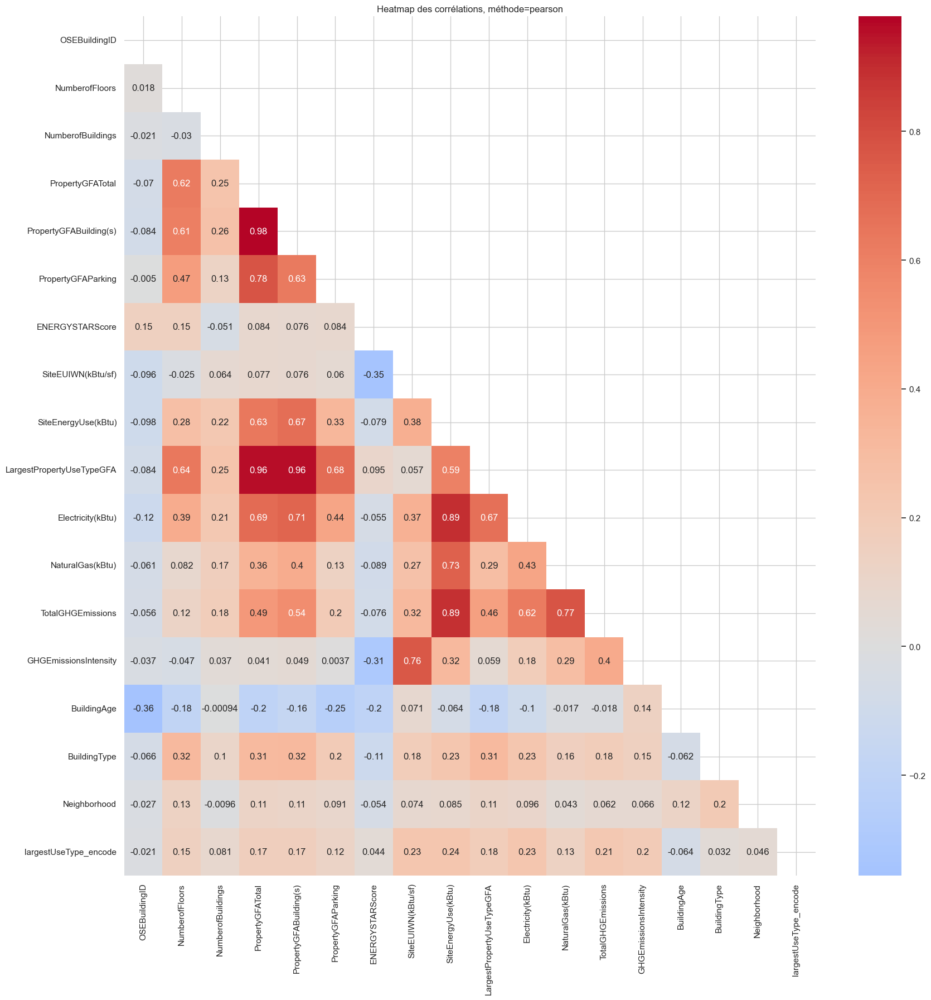

In [543]:
# Sélectionner uniquement les colonnes numériques
data_numeric = data.select_dtypes(include=['float64', 'int64'])

# Liste des méthodes de corrélation
corr_methods = ['pearson']

# Calcul de la corrélation pour chaque méthode
for corr_method in corr_methods:
    corr = data_numeric.corr(method=corr_method)  # Calculer la corrélation sur les données numériques
    mask = np.zeros_like(corr)  # Créer un masque pour afficher seulement la moitié supérieure de la matrice
    mask[np.triu_indices_from(mask)] = True  # Masquer la partie supérieure de la matrice de corrélation
    fig, ax = plt.subplots(figsize=(20, 20))  # Définir la taille de la figure
    ax = sns.heatmap(corr, annot=True, mask=mask, center=0, cmap="coolwarm")  # Afficher la heatmap
    plt.title('Heatmap des corrélations, méthode={}'.format(corr_method))  # Ajouter un titre à la heatmap
    plt.show()  # Afficher la heatmap

#OSEBuildingID,PropertyGFATotal, SiteEnergyUse(kBtu),SiteEUI(kBtu/sf)

In [545]:
data = data.drop(['OSEBuildingID','GHGEmissionsIntensity','PropertyGFATotal'] ,axis=1 ) #'SiteEnergyUse(kBtu)',a remettre

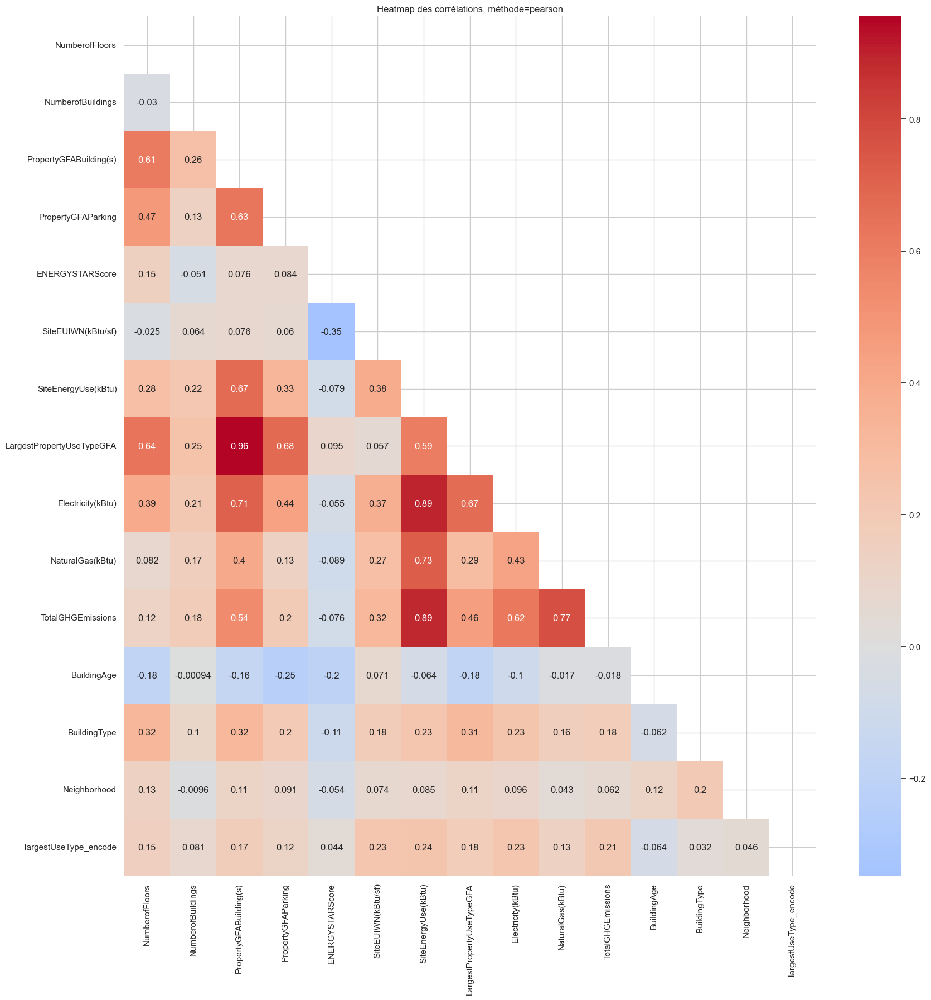

In [546]:
# Sélectionner uniquement les colonnes numériques
data_numeric = data.select_dtypes(include=['float64', 'int64'])

# Liste des méthodes de corrélation
corr_methods = ['pearson']

# Calcul de la corrélation pour chaque méthode
for corr_method in corr_methods:
    corr = data_numeric.corr(method=corr_method)  # Calculer la corrélation sur les données numériques
    mask = np.zeros_like(corr)  # Créer un masque pour afficher seulement la moitié supérieure de la matrice
    mask[np.triu_indices_from(mask)] = True  # Masquer la partie supérieure de la matrice de corrélation
    fig, ax = plt.subplots(figsize=(20, 20))  # Définir la taille de la figure
    ax = sns.heatmap(corr, annot=True, mask=mask, center=0, cmap="coolwarm")  # Afficher la heatmap
    plt.title('Heatmap des corrélations, méthode={}'.format(corr_method))  # Ajouter un titre à la heatmap
    plt.show()  # Afficher la heatmap

 ### Exportation de la base traitée <a id="exportation-base"></a>


In [548]:
data.to_csv('Final_data.csv', index=False)